%for one:
scp simpol@ssh.computerome.dk:/home/projects/ku_00017/data/generated/currents/two_trend_ExpQuad_sb_dict.pkl ~/Documents/Articles/conflict_prediction/data/computerome/

%for folder:
scp -r simpol@ssh.computerome.dk:/home/projects/ku_00017/data/generated/currents/ ~/Documents/Articles/conflict_prediction/data/computerome/

note: should zip folder first...


notes:
All right, so we appear to be very bad at os ans ns... sb also still shit, but try with individual mean...

- try individual mean
- try defferent kernels (maybe for long and short both?)

In [1]:
import numpy as np
import pandas as pd
import pymc3 as pm
import theano
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns

import pickle

from utils import plot_predictions

from IPython.display import clear_output
import warnings
warnings.simplefilter("ignore", UserWarning)

In [2]:
pkl_file = open('/home/simon/Documents/Articles/conflict_prediction/data/computerome/currents/all_tt_Exp_Mat32_sb_dict.pkl', 'rb')

ex_dict = pickle.load(pkl_file)
pkl_file.close()

In [3]:
dfs = list(ex_dict.keys())
dfs

['32_0_ged_best_sb_Matern32_map_df',
 '32_0_ged_best_sb_Matern32_mse_results_df',
 '32_0_ged_best_sb_Matern32_df_results',
 '32_0_ged_best_sb_Matern32_df_merged']

In [4]:
df_merged = ex_dict[dfs[3]]

In [5]:
def predNplot(mp, df_merged, none_zeroes):

    mse_list = []

    # new values from X.min() to X.max() + 36
    all_months = df_merged['X'].unique()
    X_new = np.linspace(all_months.min(), all_months.max(), all_months.shape[0])[:, None]

    # draw plot
    fig = plt.figure(figsize=(20, 8))
    ax = fig.gca()

    colors = sns.color_palette("hls", len(none_zeroes))


    pg_len = df_merged[df_merged['train'] == 1]['X'].unique().shape[0]
    X = theano.shared(np.zeros(pg_len)[:,None], 'X')
    y = theano.shared(np.zeros(pg_len), 'y')

    for i,j in enumerate(none_zeroes):

    # predict mu and var
        # gp.mean_func = pm.gp.mean.Constant(y[:,i].mean()) # individual mean_func

        X.set_value(df_merged[(df_merged['train'] == 1) & (df_merged['pg_id'] == j)]['X'].values[:,None])
        y.set_value(df_merged[(df_merged['train'] == 1) & (df_merged['pg_id'] == j)]['y'].values)

        X_val = df_merged[(df_merged['train'] == 0) & (df_merged['pg_id'] == j)]['X'].values[:,None]
        y_val = df_merged[(df_merged['train'] == 0) & (df_merged['pg_id'] == j)]['y'].values

        mu, var = gp.predict(X_new, 
        point=mp, given = {'gp' : gp, 'X' : X, 'y' : y, 'noise' : σ}, diag=True)
        
        sd = np.sqrt(var)

        # plot mean and 2σ intervals
        plt.plot(X_new, mu, "-", lw=2, color=colors[i], label="mean and 2σ region")
        plt.plot(X_new, mu + 2 * sd, "-", lw=1, color=colors[i])
        plt.plot(X_new, mu - 2 * sd, "-", lw=1, color=colors[i])
        plt.fill_between(X_new.flatten(), mu - 2 * sd, mu + 2 * sd, color=colors[i], alpha=0.5)

        # plot original data and true function
        plt.plot(X.get_value(), y.get_value(), "o", ms=3, color=colors[i], alpha=1.0, label="train data")
        plt.plot(X_val, y_val, "x", ms=6, color=colors[i], alpha=1.0, label="train data")

        # get out-sample mse
        true = y_val
        pred = mu[-y_val.shape[0]:]
        mse_list.append(mean_squared_error(true, pred))

    mse_mean = np.array(mse_list).mean()
    mse_std = np.array(mse_list).std()

    plt.xlabel("x")
    plt.ylim([-13, 13])
    plt.title(f"predictive mean and 2σ interval \n mse mean: {mse_mean:.3}, mse std: {mse_std:.3}")
    #plt.legend(loc=3)
    plt.show()

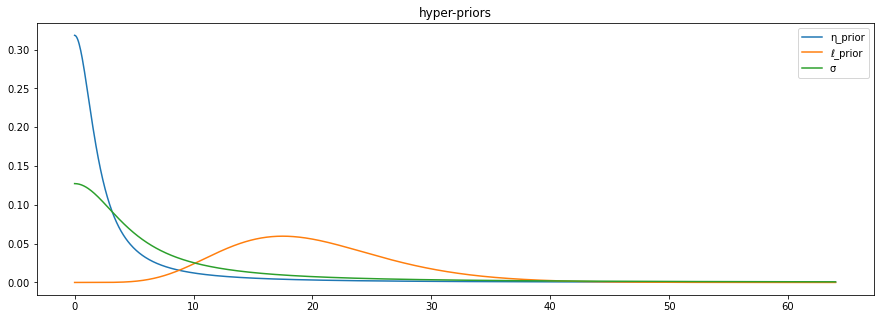

In [6]:
def get_priors(plot = True):

    η_beta = 2
    ℓ_beta = 0.4
    ℓ_alpha = 8
    σ_beta = 5

    grid = np.linspace(0,64,1000)
    
    priors = [
    ('η_prior', pm.HalfCauchy.dist(beta=η_beta, shape = 1)),
    ('ℓ_prior', pm.Gamma.dist(alpha=ℓ_alpha , beta=ℓ_beta, shape = 1)),
    ('σ', pm.HalfCauchy.dist(beta=σ_beta, shape = 1))]

    if plot == True:

        plt.figure(figsize= [15,5])
        plt.title('hyper-priors')

        for i, prior in enumerate(priors):
            plt.plot(grid, np.exp(prior[1].logp(grid).eval()), label = prior[0])

        plt.legend()
        plt.show()

    return(priors)

priors = get_priors()

In [7]:
pg_sb_sum = df_merged.groupby('pg_id').sum()['y']
none_zeroes = pg_sb_sum[pg_sb_sum > 32].index
none_zeroes.shape

(100,)

In [8]:

# Priors
η_beta = 2
ℓ_beta = 0.4
ℓ_alpha = 8
σ_beta = 5

with pm.Model() as model:

    # trend
    ℓ = pm.Gamma("ℓ", alpha=ℓ_alpha , beta=ℓ_beta)
    η = pm.HalfCauchy("η", beta=η_beta)
    cov = η **2 * pm.gp.cov.ExpQuad(1, ℓ) # Cov func.

    # noise model
    σ = pm.HalfCauchy("σ", beta=σ_beta)

    # mean func. (constant) 
    mean =  pm.gp.mean.Zero()# placeholder if you do individuel

    # GP
    gp = pm.gp.Marginal(mean_func = mean, cov_func=cov)

    # sample:
    pg_len = df_merged[df_merged['train'] == 1]['X'].unique().shape[0]
    X = theano.shared(np.zeros(pg_len)[:,None], 'X')
    y = theano.shared(np.zeros(pg_len), 'y')

    for i,j in enumerate(none_zeroes):

        print(f'{i+1}/{none_zeroes.shape[0]}')
        clear_output(wait=True)
        
        X.set_value(df_merged[(df_merged['train'] == 1) & (df_merged['pg_id'] == j)]['X'].values[:,None])
        y.set_value(df_merged[(df_merged['train'] == 1) & (df_merged['pg_id'] == j)]['y'].values)

        # gp.mean_func = pm.gp.mean.Constant(y[:,i].mean()) # individual mean_func
        y_ = gp.marginal_likelihood(f'y_{i}', X=X, y=y, noise= σ)
    
    shared_Exp_ot_mp = pm.find_MAP()

shared_Exp_ot_mp_df = pd.DataFrame({"Parameter": ["ℓ", "η", "σ"],"Value at MAP": [float(shared_Exp_ot_mp["ℓ"]), float(shared_Exp_ot_mp["η"]), float(shared_Exp_ot_mp["σ"])]})

In [9]:

# Priors
η_beta = 2
ℓ_beta = 0.4
ℓ_alpha = 8
σ_beta = 5

with pm.Model() as model:

    # trend
    ℓ = pm.Gamma("ℓ", alpha=ℓ_alpha , beta=ℓ_beta)
    η = pm.HalfCauchy("η", beta=η_beta)
    cov = η **2 * pm.gp.cov.Matern32(1, ℓ) # Cov func.

    # noise model
    σ = pm.HalfCauchy("σ", beta=σ_beta)

    # mean func. (constant) 
    mean =  pm.gp.mean.Zero()# placeholder if you do individuel

    # GP
    gp = pm.gp.Marginal(mean_func = mean, cov_func=cov)

    # sample:
    pg_len = df_merged[df_merged['train'] == 1]['X'].unique().shape[0]
    X = theano.shared(np.zeros(pg_len)[:,None], 'X')
    y = theano.shared(np.zeros(pg_len), 'y')

    for i,j in enumerate(none_zeroes):

        print(f'{i+1}/{none_zeroes.shape[0]}')
        clear_output(wait=True)
        
        X.set_value(df_merged[(df_merged['train'] == 1) & (df_merged['pg_id'] == j)]['X'].values[:,None])
        y.set_value(df_merged[(df_merged['train'] == 1) & (df_merged['pg_id'] == j)]['y'].values)

        # gp.mean_func = pm.gp.mean.Constant(y[:,i].mean()) # individual mean_func
        y_ = gp.marginal_likelihood(f'y_{i}', X=X, y=y, noise= σ)
    
    shared_Mat32_ot_mp = pm.find_MAP()

shared_Mat32_ot_mp_df = pd.DataFrame({"Parameter": ["ℓ", "η", "σ"],"Value at MAP": [float(shared_Mat32_ot_mp["ℓ"]), float(shared_Mat32_ot_mp["η"]), float(shared_Mat32_ot_mp["σ"])]})

In [10]:

# # Priors
# η_beta = 2
# ℓ_beta = 0.2
# ℓ_alpha = 8
# σ_beta = 5

# with pm.Model() as model:

#     # trend
#     ℓ = pm.Gamma("ℓ", alpha=ℓ_alpha , beta=ℓ_beta)
#     η = pm.HalfCauchy("η", beta=η_beta)
#     cov = η **2 * pm.gp.cov.ExpQuad(1, ℓ) # Cov func.

#     # noise model
#     σ = pm.HalfCauchy("σ", beta=σ_beta)

#     # mean func. (constant) 
#     mean =  pm.gp.mean.Zero()# placeholder if you do individuel

#     # GP
#     gp = pm.gp.Marginal(mean_func = mean, cov_func=cov)

#     for i,j in enumerate(none_zeroes):

#         print(f'{i+1}/{none_zeroes.shape[0]}')
#         clear_output(wait=True)
        
#         X = df_merged[(df_merged['train'] == 1) & (df_merged['pg_id'] == j)]['X'].values[:,None]
#         y = df_merged[(df_merged['train'] == 1) & (df_merged['pg_id'] == j)]['y'].values

#         # gp.mean_func = pm.gp.mean.Constant(y[:,i].mean()) # individual mean_func
#         y_ = gp.marginal_likelihood(f'y_{i}', X=X, y=y, noise= σ)
    
#     Exp_ot_mp = pm.find_MAP()

# Exp_ot_mp_df = pd.DataFrame({"Parameter": ["ℓ", "η", "σ"],"Value at MAP": [float(Exp_ot_mp["ℓ"]), float(Exp_ot_mp["η"]), float(Exp_ot_mp["σ"])]})

In [11]:

# # Priors
# η_beta = 2
# ℓ_beta = 0.2
# ℓ_alpha = 8
# σ_beta = 5

# with pm.Model() as model:

#     # trend
#     ℓ = pm.Gamma("ℓ", alpha=ℓ_alpha , beta=ℓ_beta)
#     η = pm.HalfCauchy("η", beta=η_beta)
#     cov = η **2 * pm.gp.cov.Matern32(1, ℓ) # Cov func.

#     # noise model
#     σ = pm.HalfCauchy("σ", beta=σ_beta)

#     # mean func. (constant) 
#     mean =  pm.gp.mean.Zero()# placeholder if you do individuel

#     # GP
#     gp = pm.gp.Marginal(mean_func = mean, cov_func=cov)

#     for i,j in enumerate(none_zeroes):

#         print(f'{i+1}/{none_zeroes.shape[0]}')
#         clear_output(wait=True)
        
#         X = df_merged[(df_merged['train'] == 1) & (df_merged['pg_id'] == j)]['X'].values[:,None]
#         y = df_merged[(df_merged['train'] == 1) & (df_merged['pg_id'] == j)]['y'].values

#         # gp.mean_func = pm.gp.mean.Constant(y[:,i].mean()) # individual mean_func
#         y_ = gp.marginal_likelihood(f'y_{i}', X=X, y=y, noise= σ)
    
#     Mat32_ot_mp = pm.find_MAP()

# Mat32_ot_mp_df = pd.DataFrame({"Parameter": ["ℓ", "η", "σ"],"Value at MAP": [float(Mat32_ot_mp["ℓ"]), float(Mat32_ot_mp["η"]), float(Mat32_ot_mp["σ"])]})

In [12]:
#predNplot(Exp_ot_mp, df_merged, none_zeroes)

In [13]:
#Exp_ot_mp_df

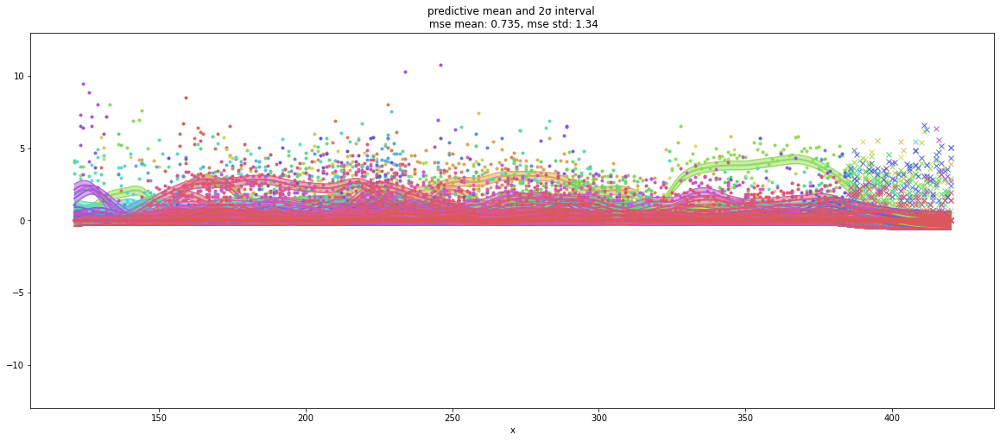

In [14]:
predNplot(shared_Exp_ot_mp, df_merged, none_zeroes)

In [15]:
shared_Exp_ot_mp_df

,Parameter,Value at MAP
0,ℓ,10.897520
1,η,0.295674
2,σ,0.579527


In [16]:
#predNplot(Mat32_ot_mp, df_merged, none_zeroes)

In [17]:
#Mat32_ot_mp_df

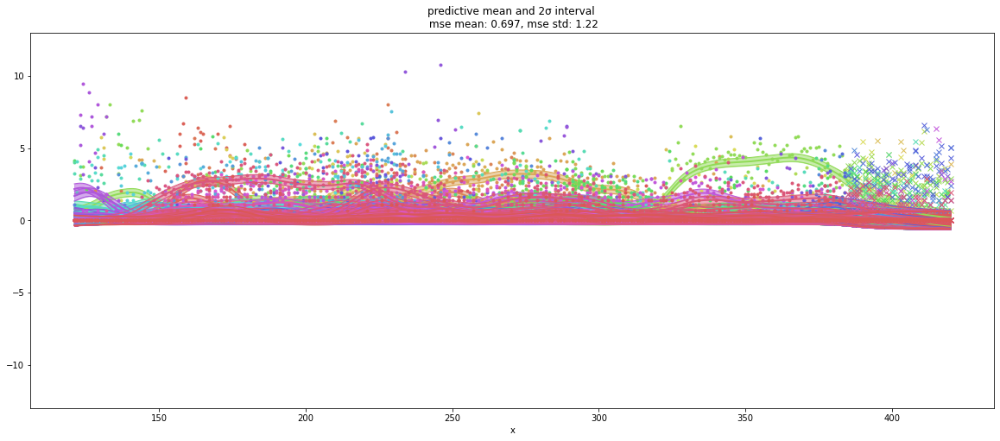

In [18]:
predNplot(shared_Mat32_ot_mp, df_merged, none_zeroes)

In [19]:
shared_Mat32_ot_mp_df

,Parameter,Value at MAP
0,ℓ,16.035326
1,η,0.297747
2,σ,0.579360


Okey. so you make four new scripts: 

- shared_ot_Exp_sb_df.py
- shared_ot_Mat32_sb_df.py
- shared_tt_Exp_Mat32_sb_df.py
- shared_ot_Exp_Exp_sb_df.py
- shared_ot_Mat32_Exp_sb_df.py
- shared_ot_Mat32_Mat32_sb_df.py

and then you run them..